# __Swarm Intelligence__
### Santiago Niño, Laura Ojeda, Daniel Velasquez
### Docente: __Darwin Martínez__
#### Curso: __Introducción a sistemas inteligentes__
#### __Universidad Sergio Arbolda - 2024 S1__

# Programa inicial

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go

In [ ]:
def f(x,y):
    """Objective function

    Arguments
    ---------
    x: np.array
        Array of X coordinates
    y: np.array
        Array of Y coordinates

    Return
    ------
    np.array
        Array of values function values
    """
    return (x-3.14)**2 + (y-2.72)**2 + np.sin(3*x+1.41) + np.sin(4*y-1.73)

In [ ]:
def plotFunction( x, y, z ):
    """ Plot the particles in a level picture

    Arguments
    ---------
    x: np.array
        Array of x positions
    y: np.array
        Array of y positions
    z: np.array
        Array of z positions

    Return
    ------
    figure
        Figure with the plot of curves
    """
    figX = plt.figure(figsize=(8,6))
    plt.imshow(z, extent=[0, 5, 0, 5], origin='lower', cmap='viridis', alpha=0.5)
    plt.colorbar()
    plt.plot( [x_min], [y_min], marker='x', markersize=5, color="white" )
    contours = plt.contour( x, y, z, 10, colors='black', alpha=0.4 )
    plt.clabel( contours, inline=True, fontsize=8, fmt="%.0f" )
    plt.show()

    return figX

Gráfica de al función $f(x,y)$ en una región cuadrada de $0 \leq x, y \leq 5$.

Se crean 20 partículas en ubicaciones aleatorias en esta región junto con sus respectivas velocidades sobre una distribución normal con $\mu =0 $ y $\sigma = 0.1$

In [ ]:
def plotParticles( x, y, z, pbest, X, V ):
    """ Plot the particles in a level picture

    Arguments
    ---------
    x: np.array
        Array of x positions
    y: np.array
        Array of y positions
    z: np.array
        Array of z positions
    pbest: np.array
        Array of best value for particles
    X: np.ndarray
        Multidimensional array with position update
    V: np.ndarray
        Multidimensional array with velocity update

    Return
    ------
    figure
        Figure with the plot of curves
    """
    figY, axY = plt.subplots(figsize=(8,6))
    figY.set_tight_layout(True)
    imgY = axY.imshow(z, extent=[0, 5, 0, 5], origin='lower', cmap='viridis', alpha=0.5)
    figY.colorbar(imgY, ax=axY)
    axY.plot([x_min], [y_min], marker='x', markersize=5, color="white")
    contours = axY.contour(x, y, z, 10, colors='black', alpha=0.4)
    axY.clabel(contours, inline=True, fontsize=8, fmt="%.0f")
    pbest_plot = axY.scatter(pbest[0], pbest[1], marker='o', color='black', alpha=0.5)
    p_plot = axY.scatter(X[0], X[1], marker='o', color='blue', alpha=0.5)
    p_arrow = axY.quiver(X[0], X[1], V[0], V[1], color='blue', width=0.005, angles='xy', scale_units='xy', scale=1)

    return figY, axY

Desde aquí se puede "_encontrar_" el $g_{best}$ como la mejor posición para todas las partículas. Como no se han explorado aún, el mejor será la posición de la partícula con el mínimo de todas las partículas  $\min(p_{best}^{i})$

* El vector $p_{bestObj}$ es el mejor valor de la función objetivo encontrado por cada partícula.
* $g_{bestObj}$ es el mejor valor escalar de la función objetivo encontrada por el enjambre.
* las funciones $\min()$ y $\text{argmin}()$ obtienen el mínimo para el problema de optimización
<br>

Sean $c_1 = c_2 = 0.1$ y $w = 0.8$. Entonces podemos actualizar las posiciones y las velocidades de acuerdo a la fórmula, y después de ello actualizar $p^{i}_{best}$ y $g_{best}$

# Funcion

In [ ]:
V=0
X=0
best=0
pbest_obj=0
gbest=0
gbest_obj=0

In [ ]:
def abejas(n_particulas, c1_val, c2_val, w_val, iteraciones):
  global V, X, pbest, pbest_obj, gbest, gbest_obj
  n_particles = n_particulas
  X = np.random.rand(2, n_particles) * 5
  V = np.random.randn(2, n_particles) * 0.1
  # inicializamos el mejor de cada particula en la particula inicial
  pbest = X
  fig0i, ax0i = plotParticles( x, y, z, pbest, X, V )

  pbest = X
  pbest_obj = f(X[0], X[1])
  gbest = pbest[:, pbest_obj.argmin()]
  gbest_obj = pbest_obj.min()

  c1 = c1_val # coeficiente cognitivo
  c2 = c2_val # coeficiente social
  #c1 = c2 = 0.1 ,
  w = w_val ##coeficiente de inercia
  # First iteration
  r = np.random.rand(2)
  V = w * V + c1*r[0]*(pbest - X) + c2*r[1]*(gbest.reshape(-1,1)-X)
  X = X + V
  obj = f(X[0], X[1])
  pbest[:, (pbest_obj >= obj)] = X[:, (pbest_obj >= obj)]
  pbest_obj = np.array([pbest_obj, obj]).max(axis=0)
  gbest = pbest[:, pbest_obj.argmin()]
  gbest_obj = pbest_obj.min()
  fig1i, ax1i = plotParticles( x, y, z, pbest, X, V )

  # Second iteration
  r = np.random.rand(2)
  V = w * V + c1*r[0]*(pbest - X) + c2*r[1]*(gbest.reshape(-1,1)-X)
  X = X + V
  obj = f(X[0], X[1])
  pbest[:, (pbest_obj >= obj)] = X[:, (pbest_obj >= obj)]
  pbest_obj = np.array([pbest_obj, obj]).max(axis=0)
  gbest = pbest[:, pbest_obj.argmin()]
  gbest_obj = pbest_obj.min()
  fig2i, ax2i = plotParticles( x, y, z, pbest, X, V )

  maxIterations = iteraciones
  for i in range(3,maxIterations):
      update()
      figIi, axIi = plotParticles( x, y, z, pbest, X, V )
      axIi.set_title('Iteration {:02d}'.format(i))

  print("PSO found best solution at f({})={}".format(gbest, gbest_obj))
  print("Global optimal at f({})={}".format([x_min,y_min], f(x_min,y_min)))

## Experimento 1

<ipython-input-7-0c52a4f7ab4e>:24: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



PSO found best solution at f([3.18562375 3.12905343])=-1.808345871732772
Global optimal at f([3.1818181818181817, 3.131313131313131])=-1.8082706615747688


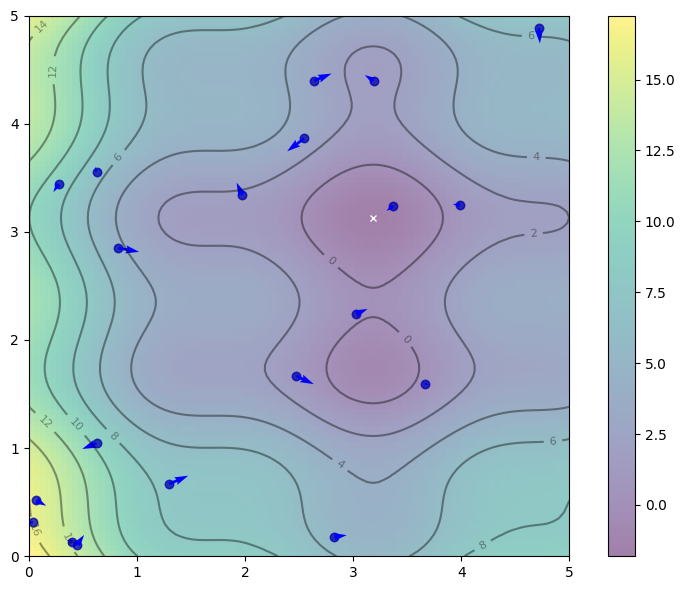

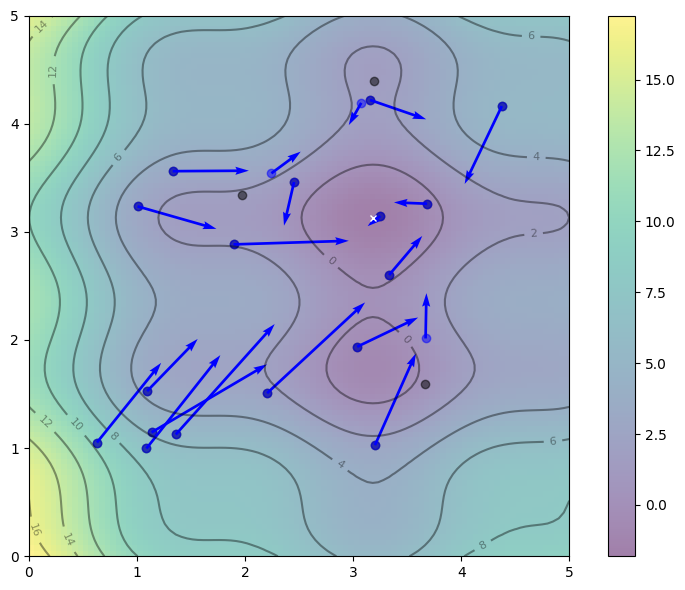

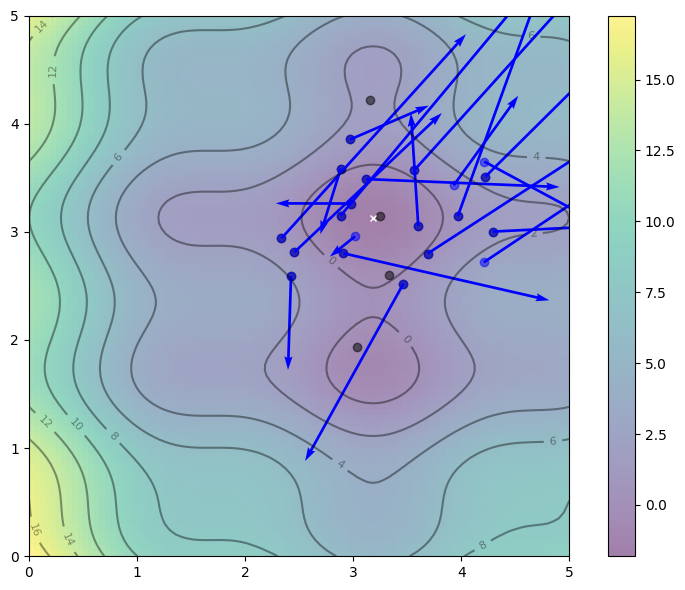

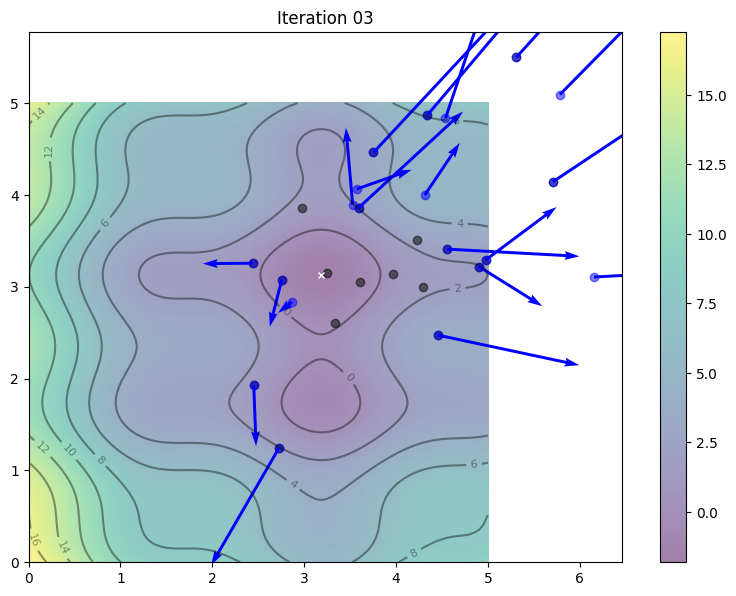

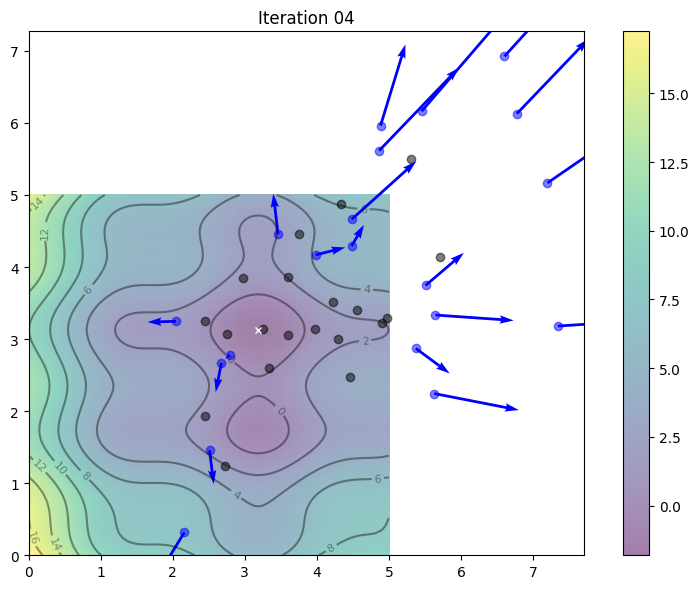

...

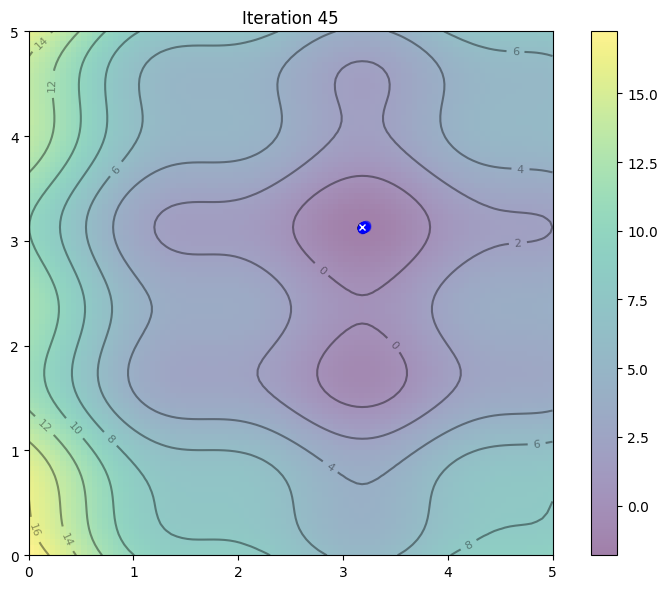

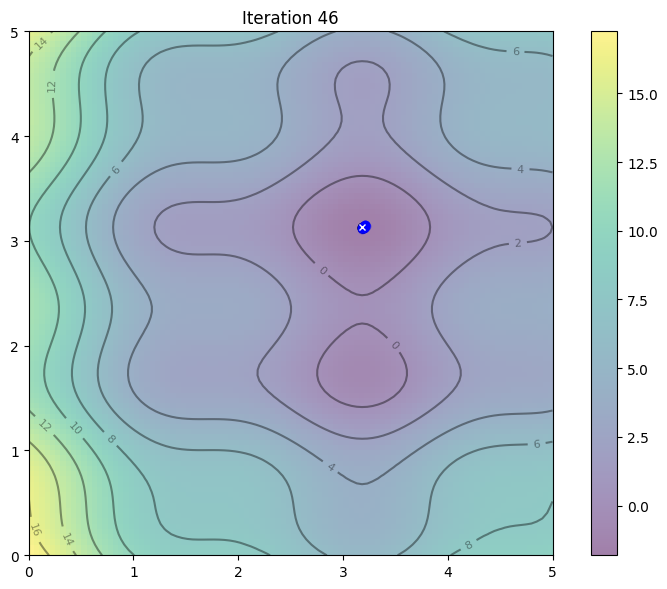

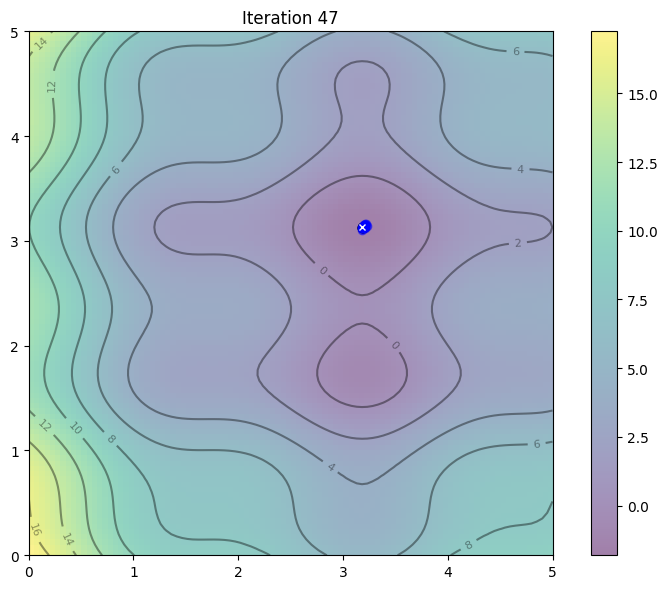

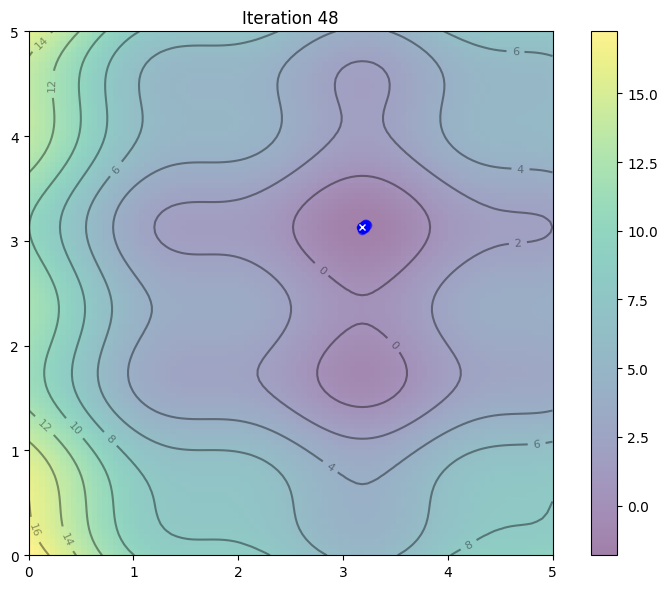

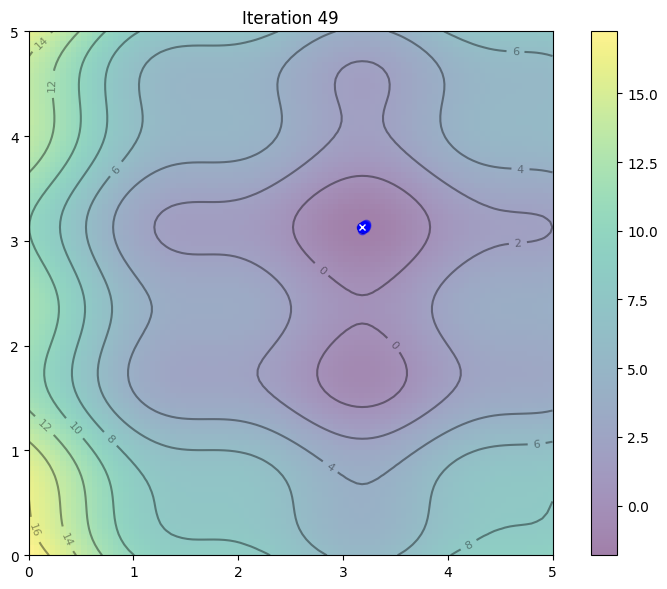

In [ ]:
abejas(20, 0.1, 0.8, 2, 50)

## Experimento 2

<ipython-input-7-0c52a4f7ab4e>:24: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



PSO found best solution at f([3.18317678 3.12398188])=-1.8080317565065336
Global optimal at f([3.1818181818181817, 3.131313131313131])=-1.8082706615747688


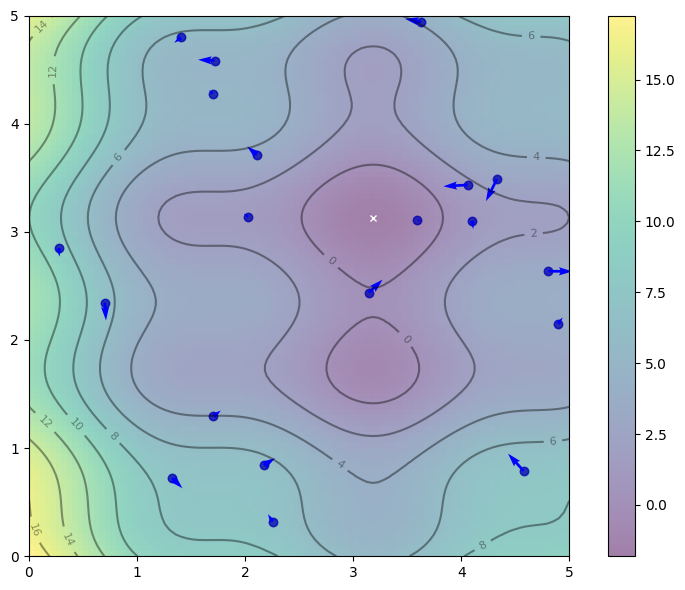

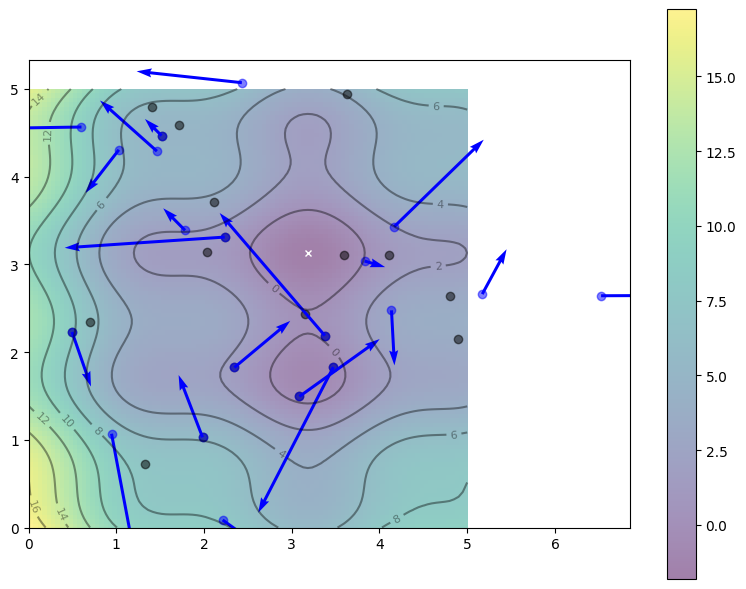

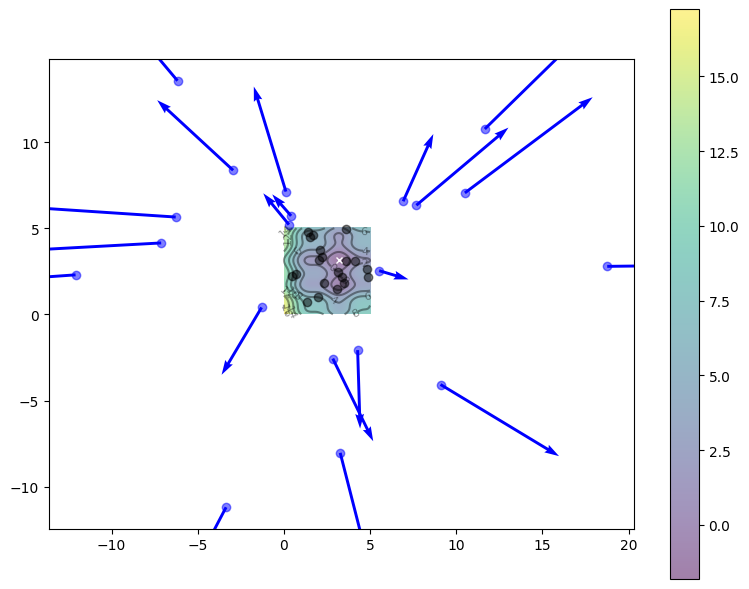

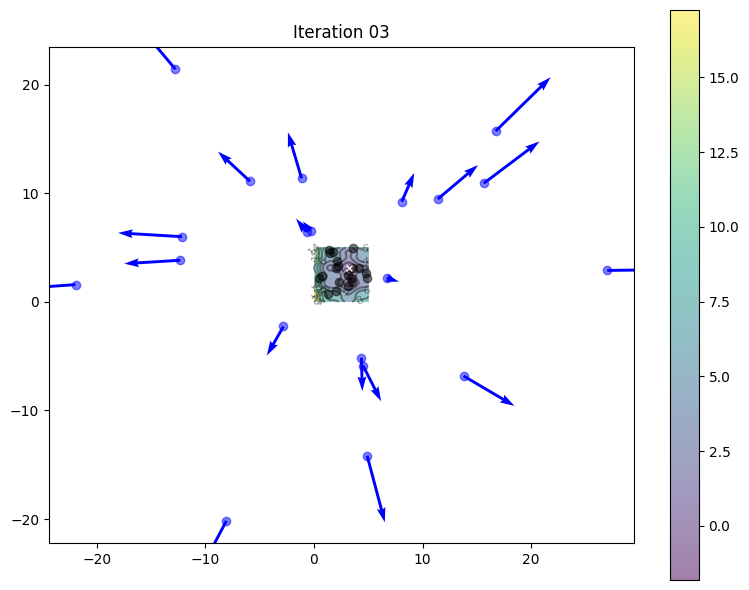

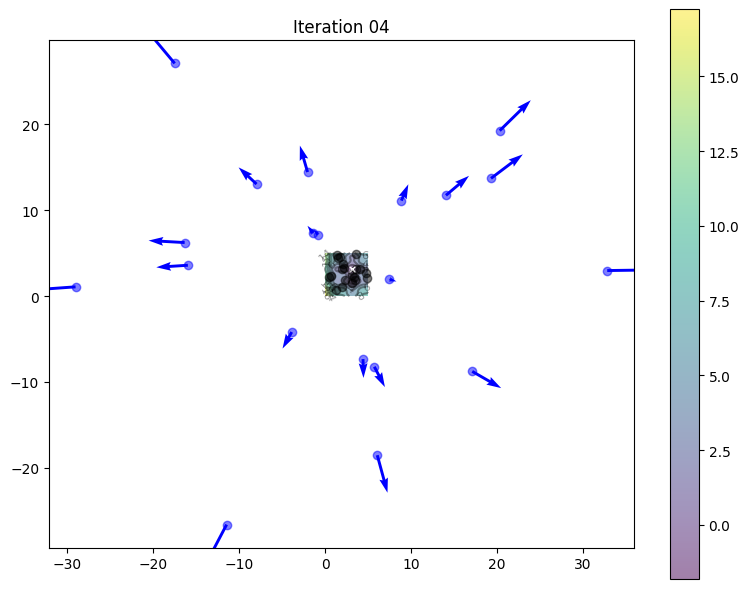

...

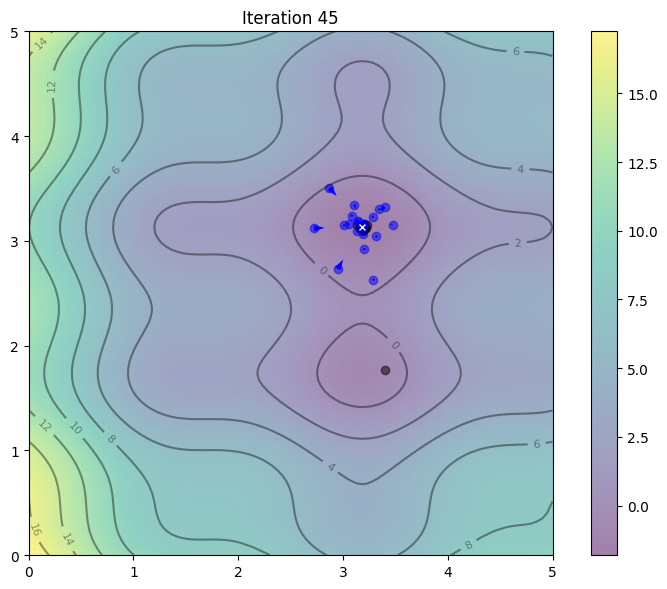

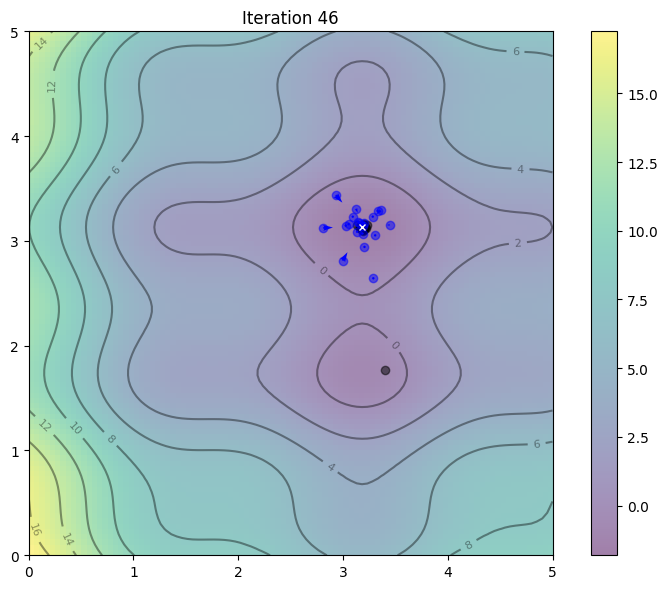

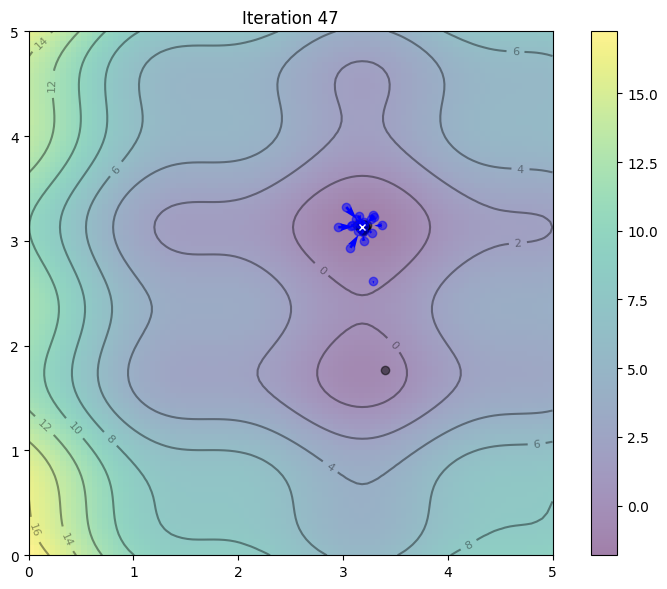

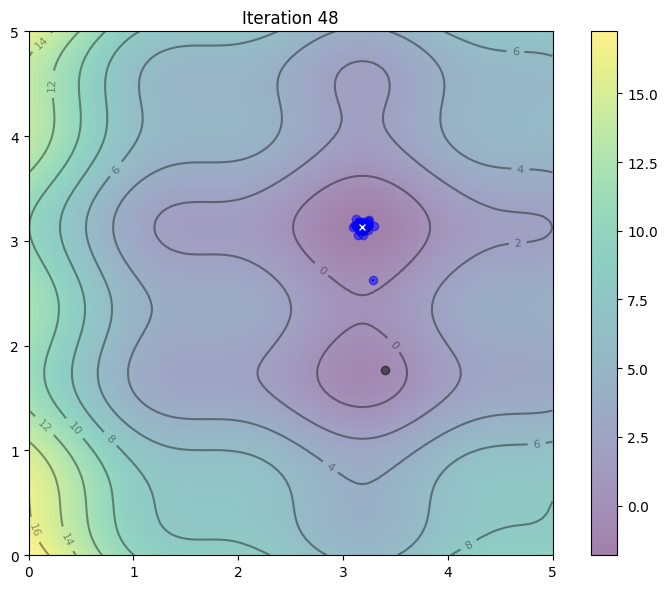

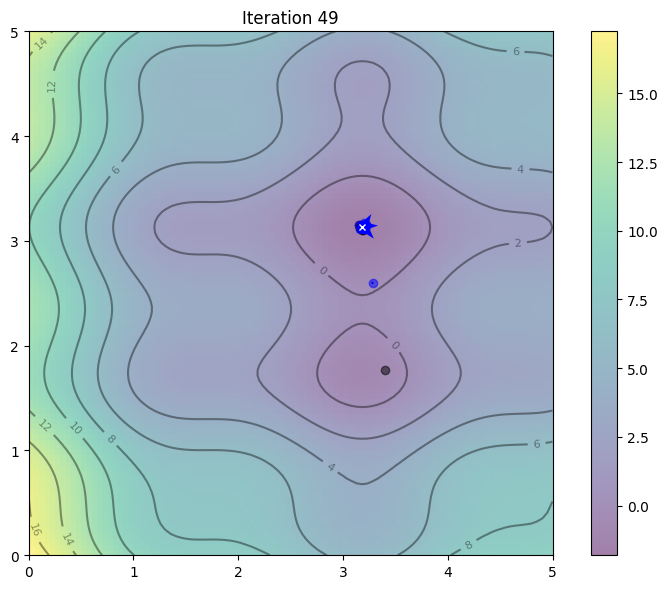

In [ ]:
abejas(20, 1, 0.5, 8, 50)

Los puntos azules son las posiciones de los agentes en los instantes de cada iteración y los puntos grises son las posiciones anteriores de cada uno

#Interpretaciones

##Descripción del algoritmo

El algoritmo de inteligencia de colmena es una técnica de optimización inspirada en el comportamiento social de las avejas. Cada posible solución a un problema de optimización es representada por una "partícula" en un espacio multidimensional. Estas partículas se mueven a través del espacio buscando la solución óptima.

Descripción del Algoritmo:

1) Inicialización de las partículas:

*   Se inicializan las posiciones y velocidades de un conjunto de partículas en el espacio de búsqueda. Esto se hace aleatoriamente dentro de un rango específico.

2) Evaluación inicial:

*   Se evalúa la función objetivo para cada partícula. Se establece el mejor valor obtenido por cada partícula hasta el momento (pbest), así como la mejor solución global (gbest) y su valor.

3) Iteraciones:

Durante un número predeterminado de iteraciones:



*   Se actualizan las velocidades y posiciones de las partículas utilizando fórmulas que combinan la memoria individual (pbest) y la memoria colectiva (gbest), junto con factores de inercia y aprendizaje cognitivo y social.
*   Se evalúa la función objetivo para las nuevas posiciones.
*   Se actualizan las mejores soluciones individuales y globales según sea necesario.

4) Convergencia:

*   El algoritmo converge hacia una solución óptima a medida que las partículas ajustan sus movimientos en función de las experiencias individuales y colectivas.

Paso Clave: Actualización de las Velocidades y Posiciones:

*   El paso crucial en el algoritmo es la actualización de las velocidades y posiciones de las partículas.Esto se logra mediante una combinación de tres componentes:


*   Inercia (w): Permite a las partículas mantener su dirección actual de movimiento.
*   Influencia cognitiva (c1): Alienta a las partículas a moverse hacia su mejor posición individual previamente encontrada.

*   Influencia social (c2): Dirige a las partículas hacia la mejor solución global encontrada por cualquier partícula en el enjambre.

5) Resultado:

*   Después de un número específico de iteraciones, el algoritmo converge hacia una solución que se considera óptima según los criterios de la función objetivo.

##Influencia de los coeficientes

1. ¿Qué tan cerca estuvo la solución?

Luego de realizar cuatro experimentos depués de las configuraciones iniciales establecidas y cambiando los coeficientes especifificados, se puede determinar que la colmena fluctuó en que tan cerca estuvo de la solución en diferentes instantes dependiendo de los coeficientes usados durante las simulaciones.

2. ¿Qué pasa si cambiamos los valores de los coeficientes cognitivo y social?

Si ajustamos los valores de los coeficientes cognitivos y sociales, las abejas, como agentes inteligentes, se vuelven más receptivas al proceso de búsqueda del objetivo, que en este caso es el valor mínimo del entorno simulado, ubicado donde se encuentra la variable x. Esto se debe a que, inicialmente, se observa cómo, después de definir sus respectivas ubicaciones aleatorias, los agentes comienzan su exploración, alejándose en algunos casos del objetivo, solo para luego agruparse debido a su naturaleza y finalmente converger en el punto objetivo. Al variar estos coeficientes, se altera el comportamiento en términos de su eficacia para encontrar el objetivo y la dispersión entre ellos durante la búsqueda. Por lo tanto, se alienta a las partículas a moverse hacia su mejor posición individual previamente encontrada y se dirije a las partículas hacia la mejor solución global encontrada por cualquier partícula en el enjambre.

3. ¿Qué pasa si cambiamos la constante de inercia?

Si variamos la constante de inercia, estamos alterando el comportamiento del ejambre de abejas en términos de que tan lejos han de explorar el perímetro para lograr una convergencia. En otras palabras, influye en la sensibilidad de las avejas de mantener o variar su dirección actual de movimiento.
